In [1]:
import numpy as np
import pandas as pd

import librosa
import librosa.display
import soundfile as sf

# Visualización
import matplotlib.pyplot as plt
plt.style.use("seaborn-deep")
from matplotlib.patches import Rectangle
import seaborn as sns

import os
from glob import glob
import IPython
from tqdm import tqdm

In [2]:
# Definiendo algunas rutas
data_dir = '../datos'
train_audios_dir = os.path.join(data_dir,"train")
test_audios_dir = os.path.join(data_dir,"test")

train_files_paths = glob(os.path.join(train_audios_dir, "*.flac"))
test_files_paths = glob(os.path.join(test_audios_dir, "*.flac"))

In [3]:
df_p = pd.read_csv("../datos/train_long.csv")
df_p

,recording_id,species_id,t_min,t_max,f_min,f_max,is_tp,duration,bandwidth
0,00204008d,4,15.0027,16.8587,2343.7500,4218.7500,False,1.8560,1875.0000
1,00204008d,8,24.4960,28.6187,3750.0000,5531.2500,False,4.1227,1781.2500
2,00204008d,21,13.8400,14.9333,3281.2500,4125.0000,False,1.0933,843.7500
3,003b04435,22,43.2533,44.8587,10687.5000,13687.5000,False,1.6054,3000.0000
4,003b04435,23,9.1254,15.2091,7235.1562,11283.3984,False,6.0837,4048.2422
...,...,...,...,...,...,...,...,...,...
8615,ffd88cd84,17,49.1253,51.6587,1312.5000,7406.2500,False,2.5334,6093.7500
8616,ffebe7313,1,35.2000,36.0960,3843.7500,5625.0000,False,0.8960,1781.2500
8617,fff163132,14,37.0827,37.6693,2531.2500,5531.2500,False,0.5866,3000.0000
8618,fff163132,17,22.5547,25.0880,1312.5000,7406.2500,False,2.5333,6093.7500


In [4]:
df_pivote = pd.read_csv("../datos/train_wide.csv", index_col=0)
df_pivote

,species_0,species_1,species_2,species_3,species_4,species_5,species_6,species_7,species_8,species_9,...,species_14,species_15,species_16,species_17,species_18,species_19,species_20,species_21,species_22,species_23
recording_id,,,,,,,,,,,,,,,,,,,,,
00204008d,-1,-1,-1,-1,0,-1,-1,-1,0,-1,...,-1,-1,-1,-1,-1,-1,-1,0,-1,-1
003b04435,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,0,0
003bec244,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,1,-1,-1,-1,-1,-1,-1,-1,-1,-1
005f1f9a5,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
006ab765f,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffc6031f8,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,0,-1,-1,-1,-1,-1,0
ffd88cd84,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,0,-1,-1,0,-1,-1,-1,-1,-1,-1
ffebe7313,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


Problema: el desbalanceo entre falsos positivos y verdaderos positivos es muy notable

False    7459
True     1161
Name: is_tp, dtype: int64


<AxesSubplot:xlabel='is_tp', ylabel='count'>

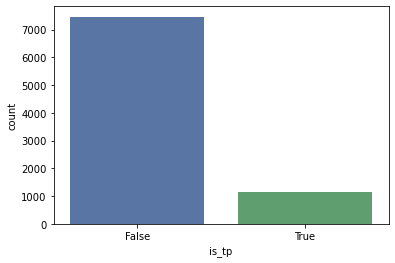

In [5]:
print(df_p["is_tp"].value_counts(normalize=False))
sns.countplot(data=df_p, x="is_tp")

In [6]:
tp_recording_ids = set(df_p.loc[df_p["is_tp"], "recording_id"].tolist() )
len(tp_recording_ids)

1132

Buscando audios que tengan verdaderos positivos y no tengan falsos positivos

In [7]:
df_pivote.apply(lambda record: (1. in record.values) and (0. not in record.values), axis=1).sum()

769

Se relajará la búsqueda.

Buscando audios que tengan más verdaderos positivos que falsos negativos.

In [8]:
df_pivote.T.apply(lambda record: list(record).count(1) > list(record).count(0)).sum()

777

In [9]:
buen_audio = df_pivote.apply(lambda record: (1. in record.values) and (0. not in record.values), axis=1)
buenos_audios = buen_audio[buen_audio].index
buenos_audios

Index(['003bec244', '006ab765f', '0099c367b', '009b760e6', '00b404881',
       '00d442df7', '011f25080', '0151b7d20', '01b41f92b', '0201197ec',
       ...
       'fbd5bbb6e', 'fc6609050', 'fc6c3b488', 'fd7cc65e1', 'fe8ce67c3',
       'fe8d9ac40', 'fea6b438a', 'ff2eb9ce5', 'ffb8d8391', 'ffb9a7b9a'],
      dtype='object', name='recording_id', length=769)

# Ejemplo de transformaciones

In [10]:
train_files_paths[0]

'../datos/train/9cccd9345.flac'

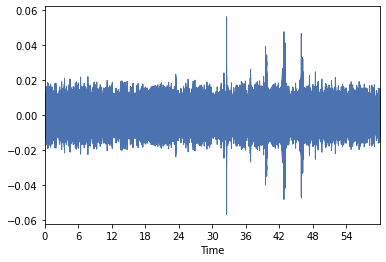

In [11]:
audio, sr = librosa.load(train_files_paths[0])
librosa.display.waveplot(audio, sr)
IPython.display.Audio(audio, rate=sr)

## Agregar rudio gaussiano

In [12]:
def add_gaussian_noise(audio, factor=0.1, recording_id=None, df=None):
    std = np.std(audio)
    noise = np.random.normal(scale=std, size=audio.size)
    new_audio = audio + factor*noise
    if recording_id is not None and df is not None:
        df_recording_id = df[df["recording_id"] == recording_id]
        new_rows = df_recording_id.copy()
        new_rows["recording_id"] = f"{recording_id}_gaussian_noise"
        df = df.append(new_rows)
        return new_audio, df
    return new_audio

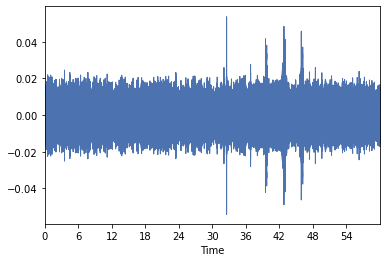

In [19]:
noised_audio = add_gaussian_noise(audio, factor=0.5)
librosa.display.waveplot(noised_audio, sr)

# sf.write("../datos/example-gaussian.flac", noised_audio, sr)

IPython.display.Audio(noised_audio, rate=sr)

No se aprecia el cambio, pero si se escuchan los audios, la transformación si se nota más "la estática"

## Traslación

In [14]:
def roll_audio(audio, sr, shift=None, recording_id=None, df=None):
    DURACION_MAX = 60
    if recording_id is not None and df is not None:
        df_recording_id = df[df["recording_id"] == recording_id]
        new_df = df_recording_id.copy()
        # Creando un solo intervalo para todas las especies
        limit_inf = new_df["t_min"].min()
        limit_sup = new_df["t_max"].max()
        duracion = limit_sup - limit_inf
        
        # Determinando que tanto se puede mover
        distancia_al_inicio = limit_inf
        distancia_al_fin = DURACION_MAX - limit_sup
        max_shift_possible = max(distancia_al_inicio, distancia_al_fin)
        
        shift = np.random.randint(1, int(max_shift_possible-1))
        if distancia_al_inicio > distancia_al_fin:
            shift = -shift  # se mueve a la izquierda
        
        # Trasladando
        rolled_audio = np.roll(audio, shift*sr)
        new_df["t_min"]+= shift
        new_df["t_max"]+= shift
        new_df["recording_id"] = f"{recording_id}_rolled"
        df = df.append(new_df)
        
        return rolled_audio, df

,recording_id,species_id,t_min,t_max,f_min,f_max,is_tp,duration,bandwidth
5298,9cccd9345,2,54.1973,55.9733,468.75,3000.0,True,1.776,2531.25


,recording_id,species_id,t_min,t_max,f_min,f_max,is_tp,duration,bandwidth
5298,9cccd9345_rolled,2,38.1973,39.9733,468.75,3000.0,True,1.776,2531.25


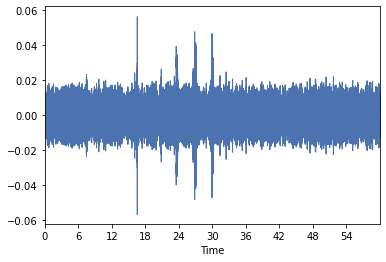

In [15]:
display(df_p.query("recording_id == '9cccd9345'"))
shifted_audio, new_df = roll_audio(audio, sr, recording_id="9cccd9345", df=df_p.copy())
display(new_df.query("recording_id == '9cccd9345_rolled'"))
librosa.display.waveplot(shifted_audio, sr)
IPython.display.Audio(shifted_audio, rate=sr)

## Cambio de tono

In [16]:
def cambiar_tono(audio, sr, n_semitonos, recording_id=None, df=None):
    new_audio = librosa.effects.pitch_shift(audio, sr, n_semitonos)
    
    if recording_id is not None and df is not None:
        df_recording_id = df[df["recording_id"] == recording_id]
        new_df = df_recording_id.copy()
        
        new_df["f_max"] = np.nan
        new_df["f_min"] = np.nan
        new_df["bandwidth"] = np.nan
        
        new_df["recording_id"] = f"{recording_id}_pitch-shifted"
        df = df.append(new_df)
        
        return new_audio, df
    
    else:
        return new_audio

,recording_id,species_id,t_min,t_max,f_min,f_max,is_tp,duration,bandwidth
5298,9cccd9345,2,54.1973,55.9733,468.75,3000.0,True,1.776,2531.25


3


,recording_id,species_id,t_min,t_max,f_min,f_max,is_tp,duration,bandwidth
5298,9cccd9345_pitch-shifted,2,54.1973,55.9733,NaN,NaN,True,1.776,NaN


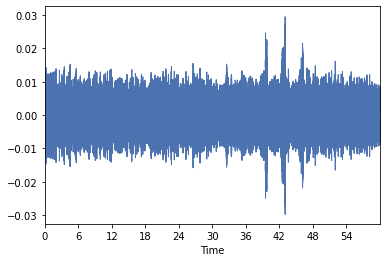

In [17]:
display(df_p.query("recording_id == '9cccd9345'"))
n_semitonos = np.random.randint(1, 4)
print(n_semitonos)
shifted_audio, new_df = cambiar_tono(audio, sr, n_semitonos, "9cccd9345", df=df_p.copy())
display(new_df.query("recording_id == '9cccd9345_pitch-shifted'"))

librosa.display.waveplot(shifted_audio, sr)
IPython.display.Audio(shifted_audio, rate=sr)
sf.write("../datos/example-pitch.flac", shifted_audio, sr)

# Aumentando datos


In [38]:
audios = df_pivote.index
new_train_audios_dir = "../datos/train2"

df_augmented = df_p.copy()
np.random.seed(42)

for recording_id in tqdm(audios):
    filepath = os.path.join(train_audios_dir, recording_id+".flac")
    audio, sr = librosa.load(filepath)
    
    sf.write(os.path.join(new_train_audios_dir, recording_id+".flac"), audio, sr)
    
    if recording_id in buenos_audios:
        # Ruido gaussiano
        factor = np.random.random()
        audio_with_noise, df_augmented = add_gaussian_noise(audio, factor, recording_id, df_augmented)
        new_recording_id = f"{recording_id}_gaussian_noise"
        new_filepath = os.path.join(new_train_audios_dir, new_recording_id+".flac")
        sf.write(new_filepath, audio_with_noise, sr)

        # Traslación
        rolled_audio, df_augmented = roll_audio(audio, sr, recording_id = recording_id, df = df_augmented)
        new_recording_id = f"{recording_id}_rolled"
        new_filepath = os.path.join(new_train_audios_dir, new_recording_id+".flac")
        sf.write(new_filepath, rolled_audio, sr)
        
        # Cambio de tono
        n_semitonos = np.random.randint(1,3)
        if np.random.random() > 0.5:
            n_semitonos *= -1
        pitch_shift_audio, df_augmented = cambiar_tono(audio, sr, n_semitonos, recording_id, df = df_augmented)
        new_recording_id = f"{recording_id}__pitch-shifted"
        new_filepath = os.path.join(new_train_audios_dir, new_recording_id+".flac")
        sf.write(new_filepath, pitch_shift_audio, sr)

100%|██████████| 4727/4727 [3:37:42<00:00,  2.76s/it]  


False    7459
True     3483
Name: is_tp, dtype: int64

<AxesSubplot:xlabel='is_tp', ylabel='count'>

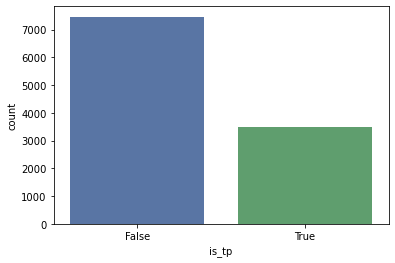

In [39]:
display(df_augmented["is_tp"].value_counts(normalize=False))
sns.countplot(data=df_augmented, x="is_tp")

In [40]:
df_augmented.to_csv("../datos/augmented_train_long.csv", index=False)

Se debe hacer el mismo procedimiento (sin el aumentado) de leer los audios para predicción, y guardarlos todos con la misma frecuencia de muestreo

In [41]:
test_audio_paths = glob("../datos/test/*.flac")
new_test_audios_dir = "../datos/test2"

for filepath in tqdm(test_audio_paths):
    audio, sr = librosa.load(filepath)
    audiofile = os.path.basename(filepath)
    assert audio.size == sr*60, f"{filepath} tiene una duración distinta de un minuto"
    
    sf.write(os.path.join(new_test_audios_dir, audiofile), audio, sr)

100%|██████████| 1992/1992 [1:22:51<00:00,  2.50s/it]
